In [12]:
import json
import pandas as pd

def load_and_merge_data(filepath1: str, filepath2: str) -> dict:
    """Load JSON data from two files and merge them."""
    with open(filepath1, 'r') as f1, open(filepath2, 'r') as f2:
        data1 = json.load(f1)
        data2 = json.load(f2)
    # Merge the dictionaries, with data2 overwriting data1 in case of conflicts
    merged_data = {**data1, **data2}
    return merged_data

def create_ml_dataframe(data: dict) -> pd.DataFrame:
    """Create a DataFrame with the specified features for ML analysis."""
    records = []
    
    for artist, attributes in data.items():
        # Basic attributes
        popularity = attributes.get('popularity', 0)
        followers = attributes.get('followers', 0)
        
        # Collaborator-based features
        collaborators = attributes.get('collaborators', {})
        num_collaborators = len(collaborators)
        
        sum_collab_popularity = 0
        for collab_name, collab_info in collaborators.items():
            # Sum collaborator popularity if available in the dataset
            collab_popularity = data.get(collab_name, {}).get('popularity', 0)
            sum_collab_popularity += collab_popularity
        
        # Add each artist's record to the dataset
        records.append({
            'name': artist,
            'popularity': popularity,
            'followers': followers,
            'num_collaborators': num_collaborators,
            'sum_collaborators_popularity': sum_collab_popularity,
            'in_playlist': int(attributes.get('in_playlist', False)),
        })
    
    # Convert to DataFrame
    df = pd.DataFrame(records)
    return df

# Load and merge data from the two JSON files
data = load_and_merge_data('11_08_playlist_layer2.json', '10_26_random_2layer.json')

# Create the ML DataFrame
df_ml = create_ml_dataframe(data)

# Save to CSV for ML analysis
df_ml.to_csv('ml_dataset.csv', index=False)
print("ML dataset created and saved to 'ml_dataset.csv'")


ML dataset created and saved to 'ml_dataset.csv'


In [4]:
df_ml.head()

,name,popularity,followers,num_collaborators,sum_collaborators_popularity,sum_collaborators_in_playlist,in_playlist
0,ROSÉ,84,7766971,5,326,2,1
1,Bruno Mars,94,60240128,25,1816,3,1
2,Billie Eilish,96,100730714,13,899,1,1
3,Sabrina Carpenter,95,13640801,20,1325,3,1
4,Sevdaliza,77,704987,15,929,2,1


In [6]:
df_ml.describe()

,popularity,followers,num_collaborators,sum_collaborators_popularity,sum_collaborators_in_playlist,in_playlist
count,3857.000000,3.857000e+03,3857.000000,3857.000000,3857.000000,3857.000000
mean,39.244491,1.230998e+06,18.742546,296.782214,0.387348,0.035261
std,24.011799,6.364674e+06,22.512729,450.290474,0.674310,0.184462
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,19.000000,6.050000e+02,6.000000,75.000000,0.000000,0.000000
50%,40.000000,9.202000e+03,13.000000,162.000000,0.000000,0.000000
75%,57.000000,2.208490e+05,22.000000,319.000000,1.000000,0.000000
max,100.000000,1.244311e+08,230.000000,5687.000000,6.000000,1.000000


In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Load your data
df = pd.read_csv('ml_dataset.csv')

# Separate features and target variable
X = df[['popularity', 'followers', 'num_collaborators', 'sum_collaborators_popularity'
]]
y = df['in_playlist']

# Split into training (90%) and testing (10%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define models to evaluate
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Classifier': SVC(),
    'Decision Tree': DecisionTreeClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(eval_metric='logloss', use_label_encoder=False),
    'LightGBM': LGBMClassifier(),
    'Neural Network (MLP)': MLPClassifier(max_iter=300)
}

# Cross-validation and model evaluation
for model_name, model in models.items():
    # Perform cross-validation
    cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='f1')
    print(f"{model_name} - Cross-Validation F1 Score: {cv_scores.mean():.2f}")
    
    # Fit model and make predictions
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    # Print results
    print(f"{model_name} - Test Set Performance:")
    print(f"  Accuracy: {accuracy:.2f}")
    print(f"  Precision: {precision:.2f}")
    print(f"  Recall: {recall:.2f}")
    print(f"  F1 Score: {f1:.2f}")
    print("-" * 30)


Logistic Regression - Cross-Validation F1 Score: 0.12
Logistic Regression - Test Set Performance:
  Accuracy: 0.96
  Precision: 1.00
  Recall: 0.06
  F1 Score: 0.12
------------------------------
Random Forest - Cross-Validation F1 Score: 0.20
Random Forest - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.50
  Recall: 0.06
  F1 Score: 0.11
------------------------------
Support Vector Classifier - Cross-Validation F1 Score: 0.03
Support Vector Classifier - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00
------------------------------
Decision Tree - Cross-Validation F1 Score: 0.22
Decision Tree - Test Set Performance:
  Accuracy: 0.94
  Precision: 0.20
  Recall: 0.19
  F1 Score: 0.19
------------------------------


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Gradient Boosting - Cross-Validation F1 Score: 0.18


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:26:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:26:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
d:\zqw\2024fall\SI608\f

Gradient Boosting - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.00
  Recall: 0.00
  F1 Score: 0.00
------------------------------
XGBoost - Cross-Validation F1 Score: 0.23
XGBoost - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.67
  Recall: 0.25
  F1 Score: 0.36
------------------------------
[LightGBM] [Info] Number of positive: 96, number of negative: 2680
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 2776, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034582 -> initscore=-3.329224
[LightGBM] [Info] Start training from score -3.329224
[LightGBM] [Info] Number of positive: 96, number of negative: 2681
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=tr

d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:26:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 96, number of negative: 2681
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 2777, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034570 -> initscore=-3.329597
[LightGBM] [Info] Start training from score -3.329597
[LightGBM] [Info] Number of positive: 96, number of negative: 2681
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 694
[LightGBM] [Info] Number of data points in the train set: 2777, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.034570 -> initscore=-3.329597
[LightGBM] [Info] Start training from score -3.329597
LightGBM - Cross-Validatio

d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network (MLP) - Cross-Validation F1 Score: 0.20
Neural Network (MLP) - Test Set Performance:
  Accuracy: 0.96
  Precision: 1.00
  Recall: 0.06
  F1 Score: 0.12
------------------------------


In [2]:
from sklearn.model_selection import GridSearchCV

# Set up the parameter grid
param_grid = {
    'learning_rate': [0.15, 0.2, 0.5],
    'max_depth': [2, 3, 4],
    'n_estimators': [80, 100, 150],
    'subsample': [0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

# Initialize XGBoost model
xgb = XGBClassifier(eval_metric='logloss', use_label_encoder=False)

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best F1 Score:", grid_search.best_score_)

# Evaluate the tuned model on the test set
best_xgb = grid_search.best_estimator_
y_pred = best_xgb.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Tuned XGBoost - Test Set Performance:")
print(f"  Accuracy: {accuracy:.2f}")
print(f"  Precision: {precision:.2f}")
print(f"  Recall: {recall:.2f}")
print(f"  F1 Score: {f1:.2f}")


Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.5, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.9}
Best F1 Score: 0.25436491838114555
Tuned XGBoost - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.40
  Recall: 0.12
  F1 Score: 0.19


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [13:50:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [3]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for tuning
param_grid = {
    'n_estimators': [30, 50, 70],          # Number of trees
    'max_depth': [None],         # Maximum depth of trees
    'min_samples_split': [8, 10, 15],         # Minimum samples to split a node
    'min_samples_leaf': [1],           # Minimum samples at a leaf node
    'max_features': [None]   # Number of features to consider for splits
}

# Initialize RandomForest model
rf = RandomForestClassifier(random_state=42)

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and the best F1 score
print("Best Parameters:", grid_search.best_params_)
print("Best F1 Score:", grid_search.best_score_)

# Evaluate the tuned model on the test set
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Tuned Random Forest - Test Set Performance:")
print(f"  Accuracy: {accuracy:.2f}")
print(f"  Precision: {precision:.2f}")
print(f"  Recall: {recall:.2f}")
print(f"  F1 Score: {f1:.2f}")


Best Parameters: {'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 30}
Best F1 Score: 0.1903448275862069
Tuned Random Forest - Test Set Performance:
  Accuracy: 0.96
  Precision: 1.00
  Recall: 0.06
  F1 Score: 0.12


In [14]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Train Random Forest, XGBoost, and LightGBM on the SMOTE-resampled data
models = {
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(eval_metric='logloss', use_label_encoder=False),
    'LightGBM': LGBMClassifier(random_state=42, class_weight='balanced')
}

for model_name, model in models.items():
    model.fit(X_resampled, y_resampled)
    y_pred = model.predict(X_test_scaled)
    
    # Evaluate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print(f"{model_name} with SMOTE - Test Set Performance:")
    print(f"  Accuracy: {accuracy:.2f}")
    print(f"  Precision: {precision:.2f}")
    print(f"  Recall: {recall:.2f}")
    print(f"  F1 Score: {f1:.2f}")
    print("-" * 30)



Random Forest with SMOTE - Test Set Performance:
  Accuracy: 0.94
  Precision: 0.37
  Recall: 0.62
  F1 Score: 0.47
------------------------------
XGBoost with SMOTE - Test Set Performance:
  Accuracy: 0.95
  Precision: 0.39
  Recall: 0.56
  F1 Score: 0.46
------------------------------
[LightGBM] [Info] Number of positive: 3351, number of negative: 3351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 6702, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
LightGBM with SMOTE - Test Set Performance:
  Accuracy: 0.96
  Precision: 0.56
  Recall: 0.56
  F1 Score: 0.56
------------------------------


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:26:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [17]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import make_scorer, f1_score

# Define the parameter grid for fine-tuning
param_grid = {
    'n_estimators': [500, 1000, 1500],
    'learning_rate': [0.1],
    'max_depth': [-1],
    'num_leaves': [31],
    'min_child_samples': [20, 30],
    'subsample': [0.8, 0.9],
    'colsample_bytree': [0.8, 1.0]
}

# Initialize LightGBM model
lgbm = LGBMClassifier(random_state=42, class_weight='balanced')

# Use GridSearchCV to optimize LightGBM for F1 Score
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    scoring=make_scorer(f1_score),  # Optimize for F1 score
    cv=3,  # 3-fold cross-validation
    verbose=1,
    n_jobs=-1  # Use all available cores
)

# Perform the grid search
grid_search.fit(X_resampled, y_resampled)

# Get the best model
best_lgbm = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Evaluate the best model on the test set
y_pred = best_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Tuned LightGBM - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the best model
import joblib
joblib.dump(best_lgbm, "tuned_lightgbm_model1.pkl")
print("Model saved as 'tuned_lightgbm_model1.pkl'")


Fitting 3 folds for each of 24 candidates, totalling 72 fits
[LightGBM] [Info] Number of positive: 3351, number of negative: 3351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000172 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 6702, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

In [18]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import joblib

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Train Random Forest, XGBoost, and LightGBM on the SMOTE-resampled data
models = {
    'LightGBM': LGBMClassifier(random_state=42, class_weight='balanced')
}

for model_name, model in models.items():
    # Train the model
    model.fit(X_resampled, y_resampled)
    y_pred = model.predict(X_test_scaled)
    
    # Evaluate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print(f"{model_name} with SMOTE - Test Set Performance:")
    print(f"  Accuracy: {accuracy:.5f}")
    print(f"  Precision: {precision:.5f}")
    print(f"  Recall: {recall:.5f}")
    print(f"  F1 Score: {f1:.5f}")
    print("-" * 30)
    
    # Save the model
    model_filename = f"{model_name.lower().replace(' ', '_')}_with_smote.pkl"
    joblib.dump(model, model_filename)
    print(f"{model_name} model saved as '{model_filename}'")


[LightGBM] [Info] Number of positive: 3351, number of negative: 3351
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 6702, number of used features: 4
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
LightGBM with SMOTE - Test Set Performance:
  Accuracy: 0.96373
  Precision: 0.56250
  Recall: 0.56250
  F1 Score: 0.56250
------------------------------
LightGBM model saved as 'lightgbm_with_smote.pkl'


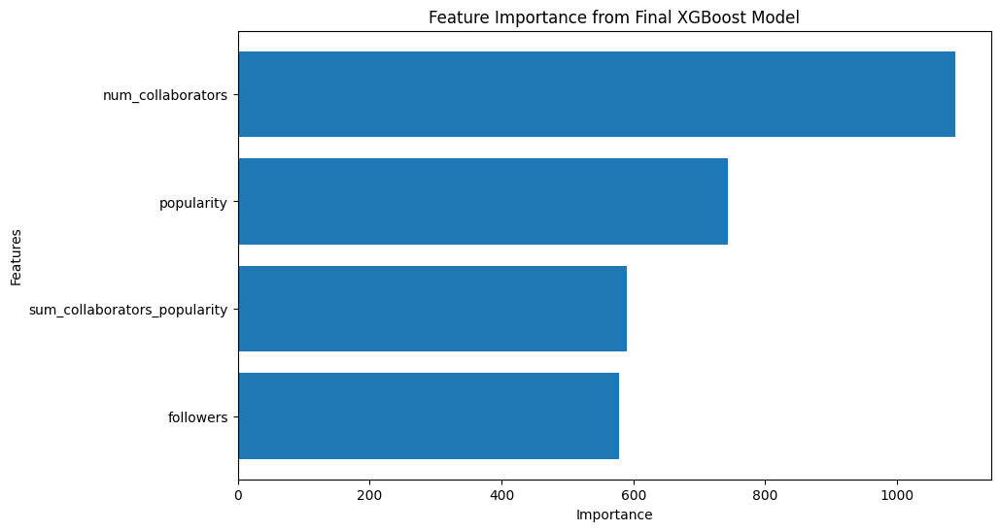

In [19]:
import joblib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Load the first saved model
model_path = "lightgbm_with_smote.pkl"
try:
    model = joblib.load(model_path)
except FileNotFoundError:
    raise FileNotFoundError(f"The model file {model_path} was not found.")

# Feature names (as per your previous dataset)
features = [
    'popularity', 'followers', 'num_collaborators', 'sum_collaborators_popularity'
]

# Extract feature importances
feature_importances = model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], align='center')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importance from Final XGBoost Model')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

In [20]:
importance_df

,Feature,Importance
2,num_collaborators,1088
0,popularity,744
3,sum_collaborators_popularity,590
1,followers,578


## ML model with Network Features

In [8]:
import pandas as pd
import ast
from tqdm import tqdm  # For the progress bar

def load_csv_data(filepath: str) -> pd.DataFrame:
    """Load the CSV data and preprocess the 'collaborators' column."""
    # Load the data
    df_network = pd.read_csv(filepath)

    # Parse the 'collaborators' column from string to dictionary
    df_network['collaborators'] = df_network['collaborators'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) else {})

    return df_network

def create_ml_dataframe(df_network: pd.DataFrame) -> pd.DataFrame:
    """Create a DataFrame with the specified features for ML analysis."""
    records = []
    
    # Wrap the DataFrame iteration with tqdm for a progress bar
    for _, row in tqdm(df_network.iterrows(), total=df_network.shape[0], desc="Processing rows"):
        # Basic attributes
        artist_name = row['name']
        artist_popularity = row['popularity']
        artist_followers = row['followers']
        artist_pagerank = row['pagerank']
        artist_closeness_cent = row['closeness_cent']
        artist_clustering = row['clustering']
        artist_deg_cent = row['deg_cent']
        artist_degree = row['degree']
        
        # Collaborator-based features
        artist_collaborators = row['collaborators']
        num_collaborators = len(artist_collaborators)
        
        sum_collab_popularity = 0
        for collab_name, collab_info in artist_collaborators.items():
            # Sum collaborator popularity if available in the dataset
            collab_popularity = df_network[df_network['name'] == collab_name]['popularity'].sum()
            sum_collab_popularity += collab_popularity
        
        # Add each artist's record to the dataset
        records.append({
            'name': artist_name,
            'popularity': artist_popularity,
            'followers': artist_followers,
            'pagerank': artist_pagerank,
            'closeness_cent': artist_closeness_cent,
            'clustering': artist_clustering,
            'deg_cent': artist_deg_cent,
            'degree': artist_degree,
            'num_collaborators': num_collaborators,
            'sum_collaborators_popularity': sum_collab_popularity,
            'in_playlist': int(row['in_playlist']),
        })
    
    # Convert to DataFrame
    df_ml_network = pd.DataFrame(records)
    return df_ml_network

# Load the new data from CSV
df_network = load_csv_data('week1.csv')

# Create the ML DataFrame
df_ml_network = create_ml_dataframe(df_network)

# Save to CSV for ML analysis
df_ml_network.to_csv('ml_dataset_2.csv', index=False)
print("ML dataset created and saved to 'ml_dataset_2.csv'")



Processing rows: 100%|██████████| 15126/15126 [00:57<00:00, 265.32it/s] 

ML dataset created and saved to 'ml_dataset_2.csv'


#### Find the best model

In [9]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import joblib

# Load the new dataset
df = pd.read_csv('ml_dataset_2.csv')

# Separate features and target variable
X = df[['popularity', 'followers', 'pagerank', 'closeness_cent', 'clustering', 'deg_cent', 'degree', 
        'num_collaborators', 'sum_collaborators_popularity']]
y = df['in_playlist']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define models for evaluation
models = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'XGBoost': XGBClassifier(eval_metric='logloss', use_label_encoder=False, random_state=42),
    'LightGBM': LGBMClassifier(random_state=42),
    'Neural Network (MLP)': MLPClassifier(max_iter=300, random_state=42)
}

# Evaluate each model
best_model = None
best_f1 = 0
for model_name, model in models.items():
    # Train the model
    model.fit(X_resampled, y_resampled)
    y_pred = model.predict(X_test_scaled)
    
    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print(f"{model_name} - Test Set Performance:")
    print(f"  Accuracy: {accuracy:.2f}")
    print(f"  Precision: {precision:.2f}")
    print(f"  Recall: {recall:.2f}")
    print(f"  F1 Score: {f1:.2f}")
    print("-" * 30)
    
    # Track the best model
    if f1 > best_f1:
        best_f1 = f1
        best_model = model

# Save the best model
joblib.dump(best_model, "best_model_with_smote_new_data.pkl")
print(f"Best model saved as 'best_model_with_smote_new_data.pkl' with F1 Score: {best_f1:.2f}")


Random Forest - Test Set Performance:
  Accuracy: 0.98
  Precision: 0.24
  Recall: 0.29
  F1 Score: 0.26
------------------------------
XGBoost - Test Set Performance:
  Accuracy: 0.98
  Precision: 0.29
  Recall: 0.50
  F1 Score: 0.37
------------------------------
[LightGBM] [Info] Number of positive: 13485, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 26970, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [13:54:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


LightGBM - Test Set Performance:
  Accuracy: 0.98
  Precision: 0.29
  Recall: 0.57
  F1 Score: 0.38
------------------------------
Neural Network (MLP) - Test Set Performance:
  Accuracy: 0.97
  Precision: 0.22
  Recall: 0.79
  F1 Score: 0.34
------------------------------
Best model saved as 'best_model_with_smote_new_data.pkl' with F1 Score: 0.38


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Load the new dataset
df = pd.read_csv('ml_dataset_2.csv')

# Separate features and target variable
X = df[['popularity', 'followers', 'pagerank', 'closeness_cent', 'clustering', 'deg_cent', 'degree',
        'num_collaborators', 'sum_collaborators_popularity']]
y = df['in_playlist']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define parameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}

# Initialize Random Forest
rf = RandomForestClassifier(random_state=42)

# RandomizedSearchCV for hyperparameter tuning
rf_random = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_grid,
    n_iter=100,
    cv=3,
    verbose=2,
    random_state=42,
    scoring='f1',
    n_jobs=-1
)

# Fit the RandomizedSearchCV
rf_random.fit(X_resampled, y_resampled)

# Get the best parameters and model
best_rf = rf_random.best_estimator_
print("Best Parameters:", rf_random.best_params_)

# Evaluate the tuned Random Forest on the test set
y_pred = best_rf.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Tuned Random Forest - Test Set Performance:")
print(f"  Accuracy: {accuracy:.2f}")
print(f"  Precision: {precision:.2f}")
print(f"  Recall: {recall:.2f}")
print(f"  F1 Score: {f1:.2f}")


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters: {'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 30, 'bootstrap': False}
Tuned Random Forest - Test Set Performance:
  Accuracy: 0.99
  Precision: 0.36
  Recall: 0.29
  F1 Score: 0.32


In [16]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define an expanded parameter grid
param_grid = {
    'n_estimators': [550, 600, 1000],
    'max_depth': [None],
    'min_samples_split': [5, 6],
    'min_samples_leaf': [1],
    'max_features': ['log2'],
    'bootstrap': [False]
}

# Initialize Random Forest
rf = RandomForestClassifier(random_state=42)

# RandomizedSearchCV for hyperparameter tuning
rf_random = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_grid,
    n_iter=100,  # Number of random samples
    cv=3,  # Cross-validation folds
    verbose=2,
    random_state=42,
    scoring='f1',  # Focus on F1 score
    n_jobs=-1  # Use all available CPUs
)

# Fit the RandomizedSearchCV
rf_random.fit(X_resampled, y_resampled)

# Get the best parameters and model
best_rf = rf_random.best_estimator_
print("Best Parameters:", rf_random.best_params_)

# Evaluate the tuned Random Forest on the test set
y_pred = best_rf.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Tuned Random Forest with Expanded Search - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the tuned model
import joblib
joblib.dump(best_rf, "tuned_rf_with_smote.pkl")
print("Model saved as 'tuned_rf_with_smote.pkl'")

d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 6 is smaller than n_iter=100. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 3 folds for each of 6 candidates, totalling 18 fits
Best Parameters: {'n_estimators': 550, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None, 'bootstrap': False}
Tuned Random Forest with Expanded Search - Test Set Performance:
  Accuracy: 0.98942
  Precision: 0.40000
  Recall: 0.28571
  F1 Score: 0.33333
Model saved as 'tuned_rf_with_smote.pkl'


In [17]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SMOTE
import numpy as np
import joblib

# Load dataset
df = pd.read_csv('ml_dataset_2.csv')

# Feature Engineering: Adding interaction terms and transformations
df['popularity_log'] = np.log1p(df['popularity'])
df['followers_log'] = np.log1p(df['followers'])
df['pagerank_log'] = np.log1p(df['pagerank'] + 1e-6)  # Avoid log(0)
df['degree_squared'] = df['degree'] ** 2

# Define features and target
features = [
    'popularity_log', 'followers_log', 'pagerank_log', 'closeness_cent',
    'clustering', 'deg_cent', 'degree', 'degree_squared', 'num_collaborators',
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define parameter grid for LightGBM
param_grid = {
    'n_estimators': [500, 1000, 1500],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 10, 15],
    'num_leaves': [31, 50, 70],
    'min_child_samples': [10, 20, 30],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

# Initialize LightGBM model
lgbm = LGBMClassifier(random_state=42)

# RandomizedSearchCV for LightGBM
print(f"Total fits to process: {len(param_grid['n_estimators']) * len(param_grid['learning_rate']) * len(param_grid['max_depth'])}")
random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_grid,
    n_iter=50,
    cv=3,
    scoring='f1',
    random_state=42,
    verbose=1,  # High-level progress
    n_jobs=-1
)

# Fit RandomizedSearchCV
random_search.fit(X_resampled, y_resampled)

# Get the best model
best_lgbm = random_search.best_estimator_
print("Best Parameters:", random_search.best_params_)

# Evaluate on test set
y_pred = best_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Tuned LightGBM with Feature Engineering - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Feature importance analysis
feature_importances = pd.DataFrame({
    'Feature': features,
    'Importance': best_lgbm.feature_importances_
}).sort_values(by='Importance', ascending=False)
print("Feature Importances:\n", feature_importances)

# Save the tuned model
joblib.dump(best_lgbm, "tuned_lgbm_with_smote_and_features.pkl")
print("Model saved as 'tuned_lgbm_with_smote_and_features.pkl'")

Total fits to process: 27
Fitting 3 folds for each of 50 candidates, totalling 150 fits
[LightGBM] [Info] Number of positive: 13485, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 26970, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

In [26]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import joblib

# Load dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target
features = ['popularity', 'followers', 'pagerank', 'closeness_cent', 'clustering', 
            'deg_cent', 'degree', 'num_collaborators', 'sum_collaborators_popularity']
X = df[features]
y = df['in_playlist']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Compute class weights
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y), y=y)
class_weights_dict = dict(enumerate(class_weights))

# Define models
models = {
    'Random Forest': RandomForestClassifier(random_state=42, class_weight=class_weights_dict),
    'XGBoost': XGBClassifier(eval_metric='logloss', use_label_encoder=False, scale_pos_weight=class_weights[1]),
    'LightGBM': LGBMClassifier(random_state=42, class_weight='balanced'),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

# Evaluate each model
results = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = f1_score(y_test, y_pred)
    results.append((name, f1))
    print(f"{name} - Test Set Performance:")
    print(f"  Accuracy: {accuracy_score(y_test, y_pred):.5f}")
    print(f"  Precision: {precision_score(y_test, y_pred):.5f}")
    print(f"  Recall: {recall_score(y_test, y_pred):.5f}")
    print(f"  F1 Score: {f1:.5f}")
    print("-" * 30)

# Ensemble model
print("Combining models using VotingClassifier...")
voting_clf = VotingClassifier(estimators=[
    ('rf', models['Random Forest']),
    ('xgb', models['XGBoost']),
    ('lgbm', models['LightGBM'])
], voting='soft')

# Fit and evaluate ensemble model
voting_clf.fit(X_train, y_train)
y_pred_ensemble = voting_clf.predict(X_test)
f1_ensemble = f1_score(y_test, y_pred_ensemble)

print("Ensemble Model - Test Set Performance:")
print(f"  Accuracy: {accuracy_score(y_test, y_pred_ensemble):.5f}")
print(f"  Precision: {precision_score(y_test, y_pred_ensemble):.5f}")
print(f"  Recall: {recall_score(y_test, y_pred_ensemble):.5f}")
print(f"  F1 Score: {f1_ensemble:.5f}")

# Save the best performing model
best_model_name, best_f1 = max(results + [("Ensemble", f1_ensemble)], key=lambda x: x[1])
best_model = models[best_model_name] if best_model_name != "Ensemble" else voting_clf
joblib.dump(best_model, "best_model_no_feature_engineering.pkl")
print(f"Best model ({best_model_name}) saved as 'best_model_no_feature_engineering.pkl' with F1 Score: {best_f1:.5f}")


Random Forest - Test Set Performance:
  Accuracy: 0.99009
  Precision: 0.00000
  Recall: 0.00000
  F1 Score: 0.00000
------------------------------
XGBoost - Test Set Performance:
  Accuracy: 0.98744
  Precision: 0.27273
  Recall: 0.21429
  F1 Score: 0.24000
------------------------------
[LightGBM] [Info] Number of positive: 128, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1666
[LightGBM] [Info] Number of data points in the train set: 13613, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
LightGBM - Test Set Performance:
  Accuracy: 0.98612
  Precision: 0.33333
  Recall: 0.50000
  F1 Score: 0.40000
------------------------------


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:47:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Gradient Boosting - Test Set Performance:
  Accuracy: 0.98876
  Precision: 0.00000
  Recall: 0.00000
  F1 Score: 0.00000
------------------------------
Combining models using VotingClassifier...
[LightGBM] [Info] Number of positive: 128, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1666
[LightGBM] [Info] Number of data points in the train set: 13613, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Ensemble Model - Test Set Performance:
  Accuracy: 0.99075
  Precision: 0.50000
  Recall: 0.28571
  F1 Score: 0.36364
Best model (LightGBM) saved as 'best_model_no_feature_engineering.pkl' with F1 Score: 0.40000


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:47:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [27]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import joblib

# Load the dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target variable (including network-based features)
features = [
    'popularity', 'followers', 'pagerank', 'closeness_cent', 
    'clustering', 'deg_cent', 'degree', 'num_collaborators', 
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Initialize and train the XGBoost model
final_xgb = XGBClassifier(eval_metric='logloss', use_label_encoder=False, random_state=42)
final_xgb.fit(X_resampled, y_resampled)

# Make predictions on the test set
y_pred = final_xgb.predict(X_test_scaled)

# Evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Final XGBoost Model with SMOTE - Test Set Performance:")
print(f"  Accuracy: {accuracy:.2f}")
print(f"  Precision: {precision:.2f}")
print(f"  Recall: {recall:.2f}")
print(f"  F1 Score: {f1:.2f}")

# Save the model
joblib.dump(final_xgb, "final_xgb_model_with_smote_model2.pkl")
print("Model saved as 'final_xgb_model_with_smote_model2.pkl'")


Final XGBoost Model with SMOTE - Test Set Performance:
  Accuracy: 0.98
  Precision: 0.29
  Recall: 0.50
  F1 Score: 0.37
Model saved as 'final_xgb_model_with_smote_model2.pkl'


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [18:49:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [22]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import joblib

# Load the dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target variable (including network-based features)
features = [
    'popularity', 'followers', 'pagerank', 'num_collaborators', 
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define models
models = {
    'XGBoost': XGBClassifier(eval_metric='logloss', use_label_encoder=False, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42, class_weight='balanced'),
    'LightGBM': LGBMClassifier(random_state=42, class_weight='balanced'),
}

# Evaluate each model
best_model = None
best_f1 = 0
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_resampled, y_resampled)
    y_pred = model.predict(X_test_scaled)

    # Evaluate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print(f"{name} - Test Set Performance:")
    print(f"  Accuracy: {accuracy:.5f}")
    print(f"  Precision: {precision:.5f}")
    print(f"  Recall: {recall:.5f}")
    print(f"  F1 Score: {f1:.5f}")
    print("-" * 30)
    
    # Track the best model
    if f1 > best_f1:
        best_f1 = f1
        best_model = model

# Save the best model
joblib.dump(best_model, "best_model_model2.pkl")
print(f"Best model saved as 'best_model_model2.pkl' with F1 Score: {best_f1:.5f}")

# Optional: Combine models using VotingClassifier
print("Combining models using VotingClassifier...")
voting_clf = VotingClassifier(estimators=[
    ('xgb', models['XGBoost']),
    ('rf', models['Random Forest']),
    ('lgbm', models['LightGBM'])
], voting='soft')

voting_clf.fit(X_resampled, y_resampled)
y_pred_ensemble = voting_clf.predict(X_test_scaled)

# Evaluate ensemble model
accuracy = accuracy_score(y_test, y_pred_ensemble)
precision = precision_score(y_test, y_pred_ensemble)
recall = recall_score(y_test, y_pred_ensemble)
f1 = f1_score(y_test, y_pred_ensemble)

print("Ensemble Model - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the ensemble model
joblib.dump(voting_clf, "ensemble_model_model2.pkl")
print("Ensemble model saved as 'ensemble_model_model2.pkl'")


Training XGBoost...
XGBoost - Test Set Performance:
  Accuracy: 0.97158
  Precision: 0.16279
  Recall: 0.50000
  F1 Score: 0.24561
------------------------------
Training Random Forest...


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:51:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Random Forest - Test Set Performance:
  Accuracy: 0.97753
  Precision: 0.18750
  Recall: 0.42857
  F1 Score: 0.26087
------------------------------
Training LightGBM...
[LightGBM] [Info] Number of positive: 13485, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 26970, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
LightGBM - Test Set Performance:
  Accuracy: 0.96761
  Precision: 0.12766
  Recall: 0.42857
  F1 Score: 0.19672
------------------------------
Best model saved as 'best_model_model2.pkl' with F1 Score: 0.26087
Combining models using VotingClassifier...


d:\zqw\2024fall\SI608\final\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [10:51:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0ed59c031377d09b8-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[LightGBM] [Info] Number of positive: 13485, number of negative: 13485
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000325 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 26970, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Ensemble Model - Test Set Performance:
  Accuracy: 0.97621
  Precision: 0.19444
  Recall: 0.50000
  F1 Score: 0.28000
Ensemble model saved as 'ensemble_model_model2.pkl'


In [ ]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import joblib

# Load the dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target variable
features = [
    'popularity', 'followers', 'pagerank', 'closeness_cent', 
    'clustering', 'deg_cent', 'degree', 'num_collaborators', 
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define the parameter grid for fine-tuning
param_grid = {
    'n_estimators': [500, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 7],
    'num_leaves': [15, 31],
    'min_child_samples': [10, 20],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Initialize LightGBM model
lgbm = LGBMClassifier(random_state=42, class_weight='balanced')

# Use GridSearchCV to optimize LightGBM for F1 Score
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='f1',
    verbose=2,
    n_jobs=1  # Sequential execution for stability
)

# Perform the grid search
grid_search.fit(X_resampled, y_resampled)

# Get the best model
best_lgbm = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Evaluate on the test set
y_pred = best_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Tuned LightGBM - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the best model
joblib.dump(best_lgbm, "best_lgbm_model.pkl")
print("Model saved as 'best_lgbm_model.pkl'")


Fitting 3 folds for each of 192 candidates, totalling 576 fits
[LightGBM] [Info] Number of positive: 8990, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 17980, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 8990, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 17980, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore

In [3]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import joblib

# Load the dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target variable
features = [
    'popularity', 'followers', 'pagerank', 'closeness_cent', 
    'clustering', 'deg_cent', 'degree', 'num_collaborators', 
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define the parameter grid for fine-tuning
param_grid = {
    'n_estimators': [1000],
    'learning_rate': [0.1],
    'max_depth': [7],
    'num_leaves': [31],
    'min_child_samples': [20],
    'subsample': [0.8],
    'colsample_bytree': [1.0]
}

# Initialize LightGBM model
lgbm = LGBMClassifier(random_state=42, class_weight='balanced')

# Use GridSearchCV to optimize LightGBM for F1 Score
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='f1',
    verbose=2,
    n_jobs=1  # Sequential execution for stability
)

# Perform the grid search
grid_search.fit(X_resampled, y_resampled)

# Get the best model
best_lgbm = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Evaluate on the test set
y_pred = best_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Tuned LightGBM - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the best model
joblib.dump(best_lgbm, "best_lgbm_model.pkl")
print("Model saved as 'best_lgbm_model.pkl'")


Fitting 3 folds for each of 1 candidates, totalling 3 fits
[LightGBM] [Info] Number of positive: 8990, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2295
[LightGBM] [Info] Number of data points in the train set: 17980, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

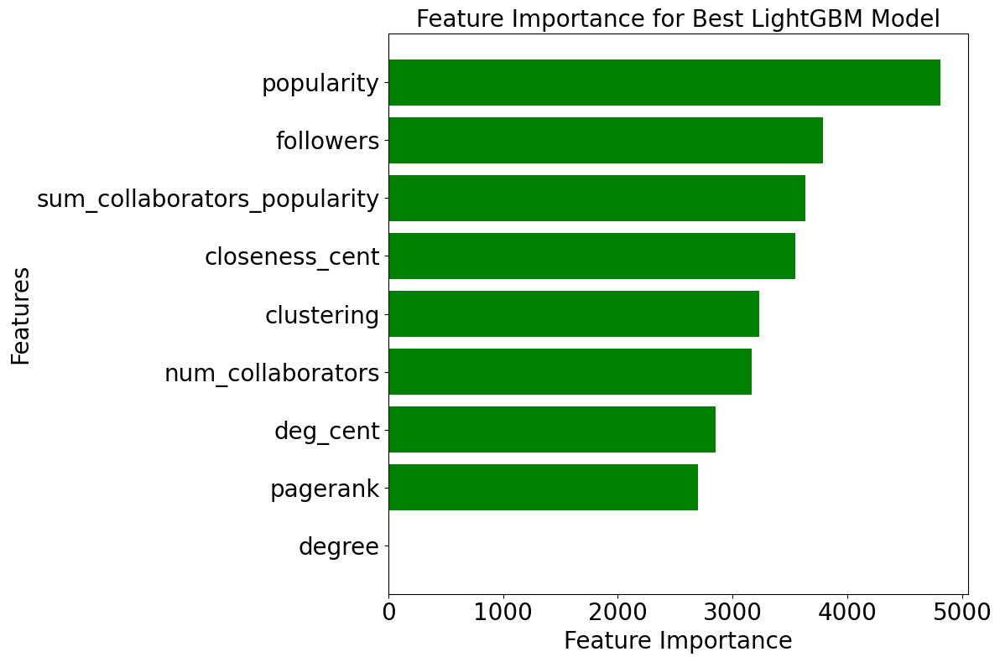

In [31]:
import joblib
import matplotlib.pyplot as plt

# Load the best model
best_lgbm_model = joblib.load("best_lgbm_model.pkl")

# Extract feature importances
feature_importances = best_lgbm_model.feature_importances_
feature_names = [
    'popularity', 'followers', 'pagerank', 'closeness_cent',
    'clustering', 'deg_cent', 'degree', 'num_collaborators',
    'sum_collaborators_popularity'
]

# Create a DataFrame for visualization
importance_data = list(zip(feature_names, feature_importances))
importance_data.sort(key=lambda x: x[1], reverse=True)
sorted_features, sorted_importances = zip(*importance_data)

# Plot feature importance
plt.figure(figsize=(12, 8))  # Increased figure size for better readability
plt.barh(sorted_features, sorted_importances, align="center", color="green")
plt.xlabel("Feature Importance", fontsize=20)
plt.ylabel("Features", fontsize=20)
plt.title("Feature Importance for Best LightGBM Model", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis for better visual arrangement
plt.tight_layout()  # Adjust layout to fit everything nicely
plt.show()

In [6]:
importance_data

[('popularity', 4812),
 ('followers', 3786),
 ('sum_collaborators_popularity', 3637),
 ('closeness_cent', 3545),
 ('clustering', 3235),
 ('num_collaborators', 3163),
 ('deg_cent', 2852),
 ('pagerank', 2698),
 ('degree', 0)]

In [24]:
df_ml.describe()

,popularity,followers,num_collaborators,sum_collaborators_popularity,in_playlist
count,3857.000000,3.857000e+03,3857.000000,3857.000000,3857.000000
mean,39.244491,1.230998e+06,18.742546,296.782214,0.035261
std,24.011799,6.364674e+06,22.512729,450.290474,0.184462
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,19.000000,6.050000e+02,6.000000,75.000000,0.000000
50%,40.000000,9.202000e+03,13.000000,162.000000,0.000000
75%,57.000000,2.208490e+05,22.000000,319.000000,0.000000
max,100.000000,1.244311e+08,230.000000,5687.000000,1.000000


In [25]:
df.describe()

,popularity,followers,pagerank,closeness_cent,clustering,deg_cent,degree,num_collaborators,sum_collaborators_popularity,in_playlist
count,15126.000000,1.512600e+04,15126.000000,15126.000000,15126.000000,15126.000000,15126.000000,15126.000000,15126.000000,15126.000000
mean,33.239323,5.160270e+05,0.000047,0.183336,0.072686,0.000170,6.168319,5.393693,135.601745,0.009388
std,22.126395,3.595323e+06,0.000107,0.030854,0.211471,0.000447,16.182401,14.647976,355.409452,0.096438
min,0.000000,0.000000e+00,0.000004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,14.000000,3.742500e+02,0.000011,0.170085,0.000000,0.000028,1.000000,0.000000,0.000000,0.000000
50%,33.000000,3.068000e+03,0.000014,0.176341,0.000000,0.000028,1.000000,0.000000,0.000000,0.000000
75%,50.000000,4.833425e+04,0.000032,0.205305,0.018182,0.000111,4.000000,3.000000,41.000000,0.000000
max,100.000000,1.244311e+08,0.006528,0.346428,1.000000,0.025705,930.000000,230.000000,5687.000000,1.000000


In [26]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import joblib

# Load the dataset
df = pd.read_csv('ml_dataset_2.csv')

# Define features and target variable
features = [
    'popularity', 'followers', 'pagerank', 'num_collaborators', 
    'sum_collaborators_popularity'
]
X = df[features]
y = df['in_playlist']

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Define the parameter grid for fine-tuning
param_grid = {
    'n_estimators': [500, 1000],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [5, 7],
    'num_leaves': [15, 31],
    'min_child_samples': [10, 20],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Initialize LightGBM model
lgbm = LGBMClassifier(random_state=42, class_weight='balanced')

# Use GridSearchCV to optimize LightGBM for F1 Score
grid_search = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=3,  # 3-fold cross-validation
    scoring='f1',
    verbose=2,
    n_jobs=1  # Sequential execution for stability
)

# Perform the grid search
grid_search.fit(X_resampled, y_resampled)

# Get the best model
best_lgbm = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Evaluate on the test set
y_pred = best_lgbm.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation metrics
print("Tuned LightGBM - Test Set Performance:")
print(f"  Accuracy: {accuracy:.5f}")
print(f"  Precision: {precision:.5f}")
print(f"  Recall: {recall:.5f}")
print(f"  F1 Score: {f1:.5f}")

# Save the best model
joblib.dump(best_lgbm, "best_lgbm_model1.pkl")
print("Model saved as 'best_lgbm_model1.pkl'")


Fitting 3 folds for each of 192 candidates, totalling 576 fits
[LightGBM] [Info] Number of positive: 8990, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000220 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 17980, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, min_child_samples=10, n_estimators=500, num_leaves=15, subsample=0.8; total time=   0.1s
[LightGBM] [Info] Number of positive: 8990, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGB

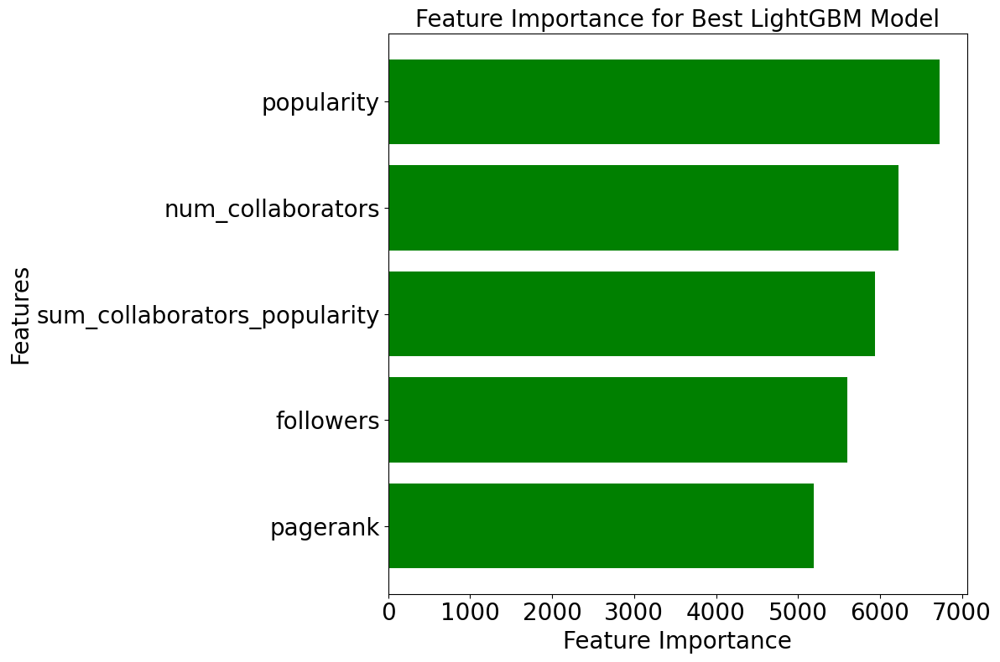

In [33]:
import joblib
import matplotlib.pyplot as plt

# Load the best model
best_lgbm_model = joblib.load("best_lgbm_model1.pkl")

# Extract feature importances
feature_importances = best_lgbm_model.feature_importances_
feature_names = [
    'popularity', 'followers', 'pagerank', 'num_collaborators', 
    'sum_collaborators_popularity'
]

# Create a DataFrame for visualization
importance_data = list(zip(feature_names, feature_importances))
importance_data.sort(key=lambda x: x[1], reverse=True)
sorted_features, sorted_importances = zip(*importance_data)

# Plot feature importance
# Plot feature importance
plt.figure(figsize=(12, 8))  # Increased figure size for better readability
plt.barh(sorted_features, sorted_importances, align="center", color="green")
plt.xlabel("Feature Importance", fontsize=20)
plt.ylabel("Features", fontsize=20)
plt.title("Feature Importance for Best LightGBM Model", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.gca().invert_yaxis()  # Invert y-axis for better visual arrangement
plt.tight_layout()  # Adjust layout to fit everything nicely
plt.show()

In [34]:
importance_data

[('popularity', 6726),
 ('num_collaborators', 6226),
 ('sum_collaborators_popularity', 5936),
 ('followers', 5602),
 ('pagerank', 5192)]